In [2]:
import cv2
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import colorsys
import numpy as np
import networkx as nx
from numerics import classification_impurity


img_path = './../data/london.jpg'

img = cv2.imread(img_path)

resized_img = cv2.resize(img, (0, 0), fx=0.2, fy=0.2)

img_array = np.array(resized_img)
print(img_array.shape)

img_arr_norm = img_array / 255 

(619, 709, 3)


In [3]:
cv2.imshow('image', resized_img)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [4]:
from kmeans import nkmeanspp

k = 5

centers, labels = nkmeanspp(img_arr_norm.reshape(-1, 3), k, n=1, verbose=True)

print(centers)

Attempt 0
Iteration 0
Iteration 10
Iteration 20
Iteration 30
Iteration 40
Iteration 50
Finished in 52 iterations
[[0.49623684 0.41618978 0.47408492]
 [0.41944022 0.35917567 0.43681693]
 [0.33742226 0.26870125 0.22934921]
 [0.39555336 0.32392343 0.3249132 ]
 [0.57249049 0.49697847 0.55348807]]


In [5]:
# plot as a bar chart
def plot_colors(colors):
    fig = plt.figure()
    ax = fig.add_subplot(111)
    bar = ax.bar(range(len(colors)), [1]*len(colors), color=colors, edgecolor='black')
    ax.set_yticks([])
    ax.set_xticks(range(len(colors)))
    ax.set_xticklabels(['' for _ in range(len(colors))])
    plt.show()
    
def reverse_rgb(rgb_arr):
    return np.array([rgb_arr[:, 2], rgb_arr[:, 1], rgb_arr[:, 0]]).T


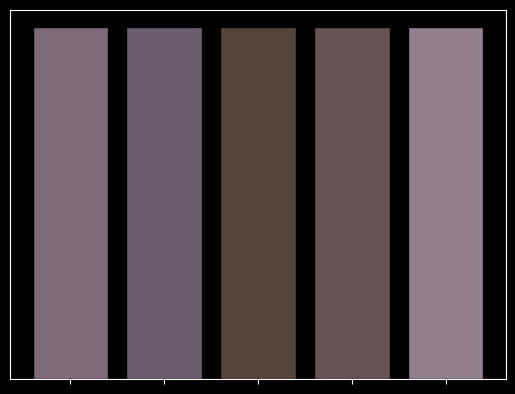

In [6]:
plot_colors(centers)

Attempt 0
Iteration 0
Iteration 10
Iteration 20
Iteration 30
Iteration 40
Iteration 50
Iteration 60
Iteration 70
Iteration 80
Iteration 90
Iteration 100
Iteration 110
Iteration 120
Iteration 130
Iteration 140
Iteration 150
Iteration 160
Iteration 170
Iteration 180
Finished in 189 iterations


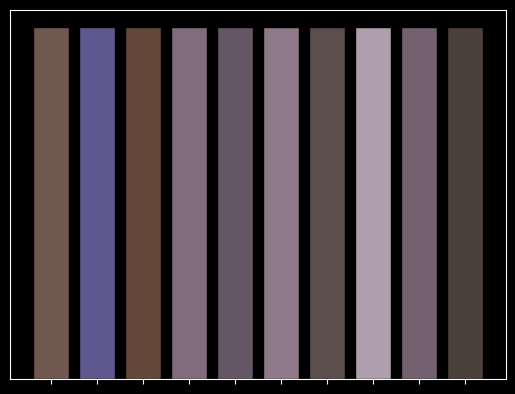

In [7]:
centers, labels = nkmeanspp(img_arr_norm.reshape(-1, 3), 10, n=1, verbose=True)
plot_colors(centers)

Attempt 0
Iteration 0
Iteration 10
Iteration 20
Iteration 30
Iteration 40
Iteration 50
Iteration 60
Iteration 70
Iteration 80
Iteration 90
Iteration 100
Iteration 110
Finished in 113 iterations
Attempt 1
Iteration 0
Iteration 10
Iteration 20
Iteration 30
Iteration 40
Iteration 50
Iteration 60
Iteration 70
Iteration 80
Iteration 90
Iteration 100
Iteration 110
Iteration 120
Iteration 130
Finished in 130 iterations
Attempt 2
Iteration 0
Iteration 10
Iteration 20
Iteration 30
Finished in 36 iterations
Attempt 3
Iteration 0
Iteration 10
Iteration 20
Iteration 30
Iteration 40
Iteration 50
Iteration 60
Finished in 61 iterations
Attempt 4
Iteration 0
Iteration 10
Iteration 20
Iteration 30
Iteration 40
Iteration 50
Finished in 57 iterations


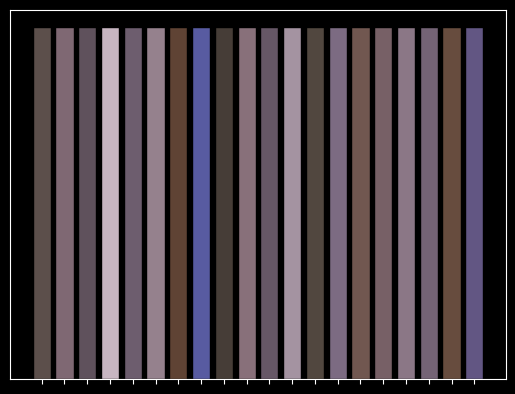

In [8]:
centers, labels = nkmeanspp(img_arr_norm.reshape(-1, 3), 20, n=5, verbose=True)
plot_colors(centers)

In [9]:
from hierarhical import hierarchical_lance_williams
from hierarhical import merging_avg_coefs, merging_centroid_coefs, merging_complete_coefs, merging_single_coefs, merging_ward_coefs

padress = {}
labelss = {}

coefs = {
    'single': merging_single_coefs,
    'centroid': merging_centroid_coefs,
    'avg': merging_avg_coefs,
    'complete': merging_complete_coefs,
    'ward': merging_ward_coefs
}

much_compressed = cv2.resize(img, (0, 0), fx=0.01, fy=0.01)

print(f'shape: {much_compressed.shape}, size: {much_compressed.shape[0] * much_compressed.shape[1]}')

cv2.imshow('image', much_compressed)
cv2.waitKey(0)
cv2.destroyAllWindows()


shape: (31, 35, 3), size: 1085


In [10]:

for i, c in enumerate(coefs.items()):
    coef_name, coef = c
    impurities = []
    labels, padre = hierarchical_lance_williams(much_compressed.reshape(-1, 3), 1, merging_coefs=coef)
    padress[coef_name] = padre
    labelss[coef_name] = labels
    print(f'done: {coef_name}')
    

done: single
done: centroid
done: avg
done: complete
done: ward


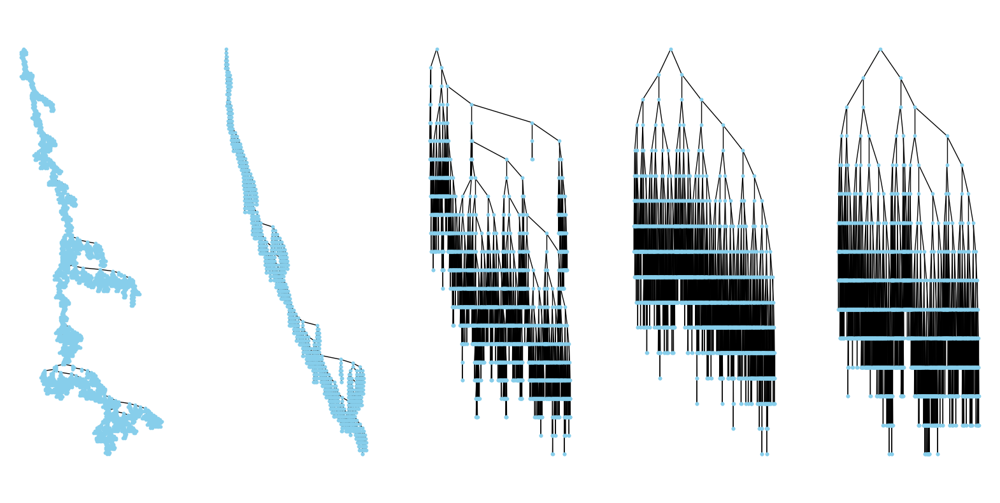

In [11]:
# from numerics import gen_G
import networkx as nx

def gen_G(padre):
    G = nx.DiGraph()
    for i, p in enumerate(padre):
        if p != -1:
            G.add_edge(p, i)
    return G

ax, fig = plt.subplots(1, 5, figsize=(20, 10))

for i, c in enumerate(coefs.items()):
    #draw tree
    coef_name, coef = c
    G = gen_G(padress[coef_name])
    pos = nx.drawing.nx_agraph.graphviz_layout(G, prog='dot')
    nx.draw(G, pos, with_labels=False, arrows=False, node_size=10, node_color='skyblue', font_size=10, font_weight='bold', ax=fig[i])

In [12]:
node_arr = much_compressed.reshape(-1, 3)

In [13]:

node_colorss_w = {}
node_colorss_uw = {}

def gen_rev_padre(padre):
    rev_padre = {}
    for i, p in enumerate(padre):
        if p != -1:
            if p not in rev_padre:
                rev_padre[p] = []
            rev_padre[p].append(i)
    return rev_padre

def gen_node_colors_weighted(rev_padre, root, node_arr=node_arr):
    node_colors = {}
    def dfs(node):
        if node not in rev_padre:
            node_colors[node] = node_arr[node]
            return node_arr[node], 1
        res = []
        weights = []
        for child in rev_padre[node]:
            col, w = dfs(child)
            res.append(col)
            weights.append(w)
        
        res = np.average(res, axis=0, weights=weights)
        node_colors[node] = res
        return res, sum(weights)
    
    dfs(root)
    return node_colors

def gen_node_colors_unweighted(rev_padre, root, node_arr=node_arr):
    node_colors = {}
    def dfs(node):
        if node not in rev_padre:
            node_colors[node] = node_arr[node]
            return node_arr[node]
        res = []
        for child in rev_padre[node]:
            col = dfs(child)
            res.append(col)
        
        res = np.average(res, axis=0)
        node_colors[node] = res
        return res
    
    dfs(root)
    return node_colors
    

for name, padre in padress.items():
    rev_padre = gen_rev_padre(padre)
    root = len(padre) - 1
    
    node_colorss_w[name] = gen_node_colors_weighted(rev_padre, root)
    node_colorss_uw[name] = gen_node_colors_unweighted(rev_padre, root)
    
    print(f'done: {name}')
    

done: single
done: centroid
done: avg
done: complete
done: ward


In [14]:
def avg_color(c1, c2):
    return tuple([(c1[i] + c2[i]) / 2 for i in range(3)])

def gen_color_G(padre, weighted=True, node_arr=node_arr):
    rev_padre = gen_rev_padre(padre)
    root = len(padre) - 1
    
    if weighted:
        node_colors = gen_node_colors_weighted(rev_padre, root, node_arr=node_arr)
    else:
        node_colors = gen_node_colors_unweighted(rev_padre, root, node_arr=node_arr)
        
    G = nx.DiGraph()
    
    for i, p in enumerate(padre):
        col = tuple(node_colors[i])
        col = tuple([c/255 for c in col])
        # print(col)
        G.add_node(i, color=col)
        
    for i, p in enumerate(padre):
        if p != -1:
            col = avg_color(G.nodes[p]['color'], G.nodes[i]['color'])
            # print(col)
            G.add_edge(p, i, color=col)
        
    return G

/home/ts/.local/lib/python3.10/site-packages/pygraphviz/agraph.py:1409: RuntimeWarning: Warning: (0.5137254901960784, 0.43137254901960786, 0.4666666666666667) is not a known color.

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)
/home/ts/.local/lib/python3.10/site-packages/pygraphviz/agraph.py:1409: RuntimeWarning: Warning: (0.5137254901960784, 0.43137254901960786, 0.4666666666666667) is not a known color.

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)
/home/ts/.local/lib/python3.10/site-packages/pygraphviz/agraph.py:1409: RuntimeWarning: Warning: (0.5137254901960784, 0.43137254901960786, 0.4666666666666667) is not a known color.

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)
/home/ts/.local/lib/python3.10/site-packages/pygraphviz/agraph.py:1409: RuntimeWarning: Warning: (0.5137254901960784, 0.43137254901960786, 0.4666666666666667) is not a known color.

  warnings.warn(b"".join(errors).decode(self.encoding), 

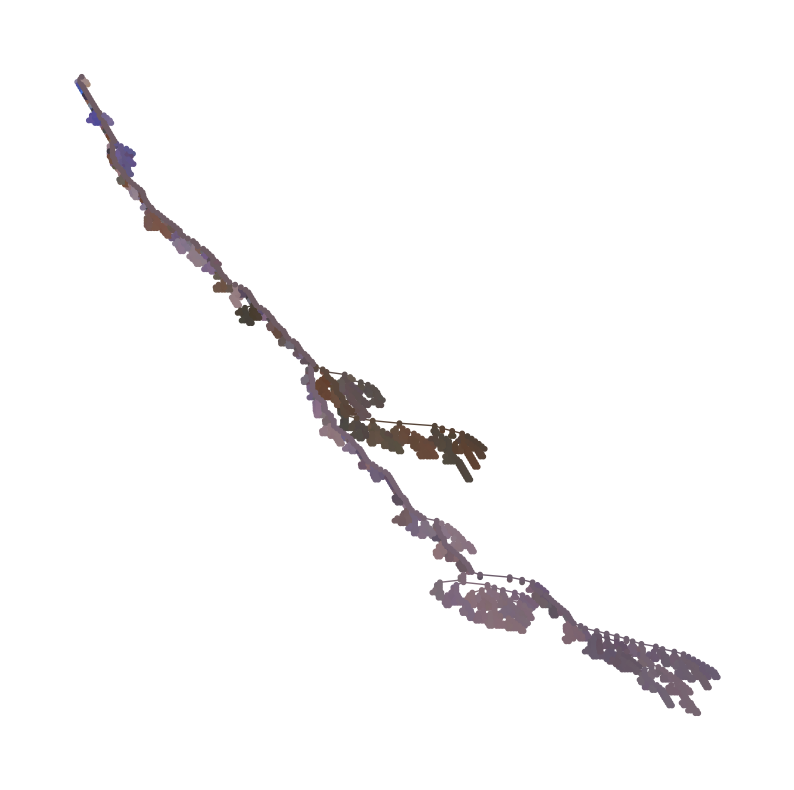

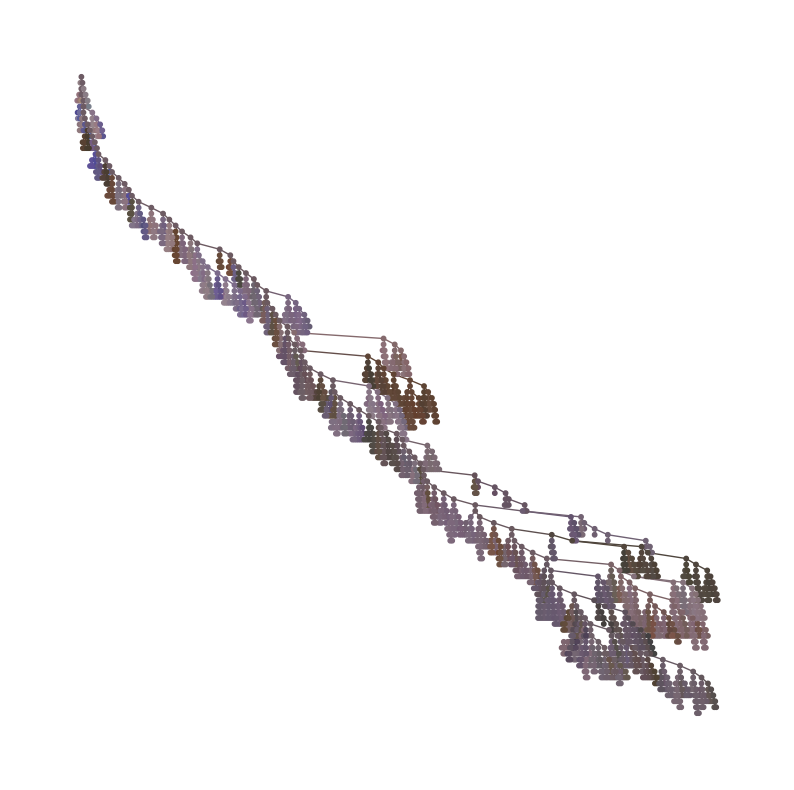

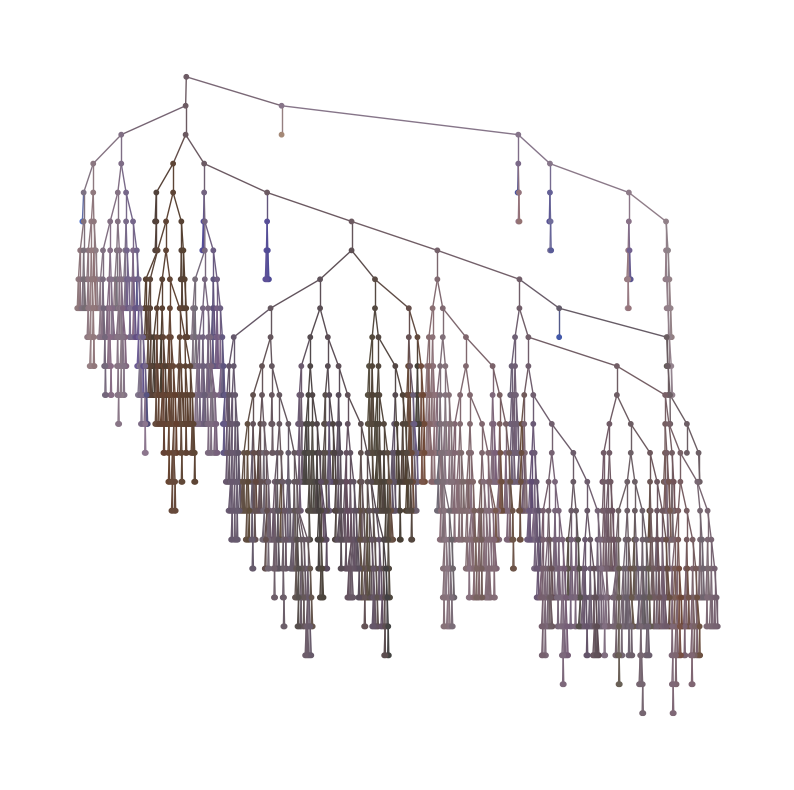

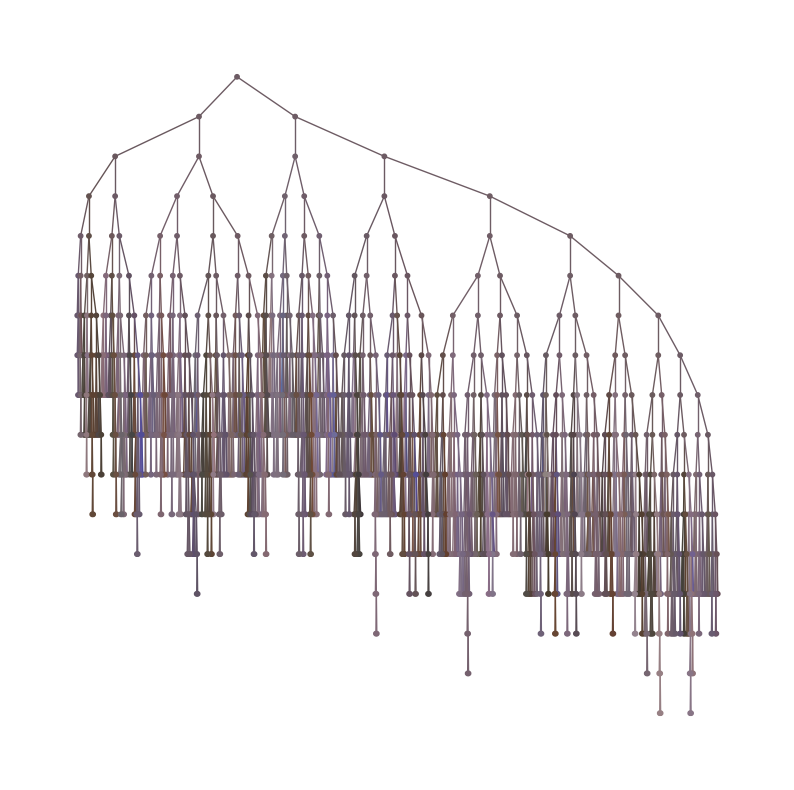

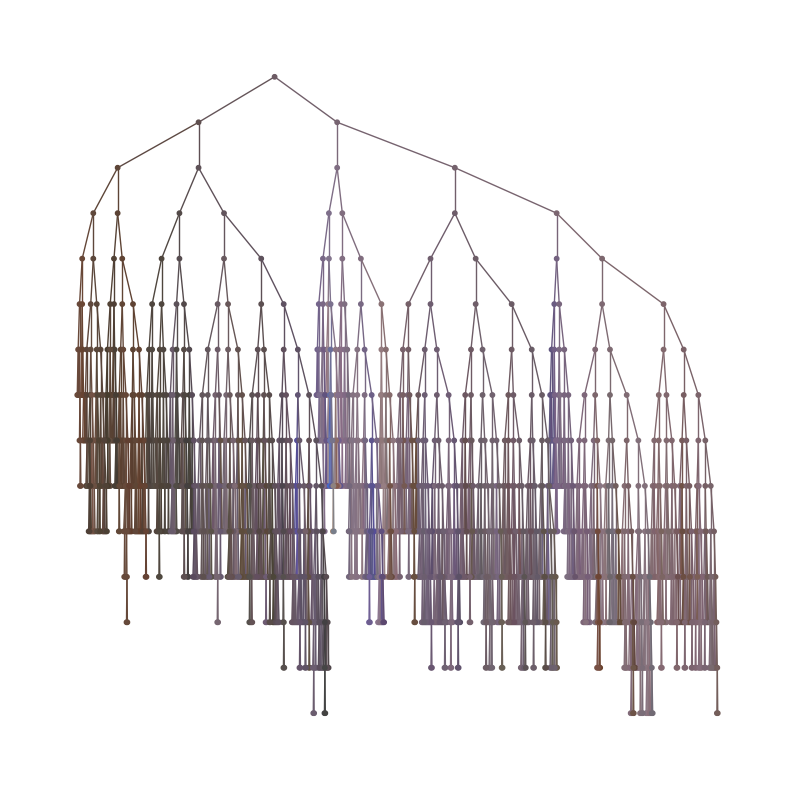

In [15]:
# ax, fig = plt.subplots(1, 5, figsize=(20, 10))

img_name = img_path.split('/')[-1].split('.')[0]

for i, c in enumerate(coefs.items()):
    fig = plt.figure()
    fig.set_size_inches(10, 10)
    ax = fig.add_subplot(111, facecolor='white')
    fig.patch.set_facecolor('white')
    
    coef_name, coef = c
    
    G = gen_color_G(padress[coef_name], weighted=True)
    
    node_colors = [G.nodes[i]['color'] for i in G.nodes]
    edge_colors = [G.edges[e]['color'] for e in G.edges]
    
    pos = nx.drawing.nx_agraph.graphviz_layout(G, prog='dot')
    nx.draw(G, pos, with_labels=False, arrows=False, node_size=10, ax=ax, node_color=node_colors, edge_color=edge_colors)
    
    # save each plot to a file
    plt.savefig(f'./../output/{img_name}_{coef_name}.png')

/home/ts/.local/lib/python3.10/site-packages/pygraphviz/agraph.py:1409: RuntimeWarning: Warning: (0.5137254901960784, 0.43137254901960786, 0.4666666666666667) is not a known color.

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)
/home/ts/.local/lib/python3.10/site-packages/pygraphviz/agraph.py:1409: RuntimeWarning: Warning: (0.5137254901960784, 0.43137254901960786, 0.4666666666666667) is not a known color.

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)
/home/ts/.local/lib/python3.10/site-packages/pygraphviz/agraph.py:1409: RuntimeWarning: Warning: (0.5137254901960784, 0.43137254901960786, 0.4666666666666667) is not a known color.

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)
/home/ts/.local/lib/python3.10/site-packages/pygraphviz/agraph.py:1409: RuntimeWarning: Warning: (0.5137254901960784, 0.43137254901960786, 0.4666666666666667) is not a known color.

  warnings.warn(b"".join(errors).decode(self.encoding), 

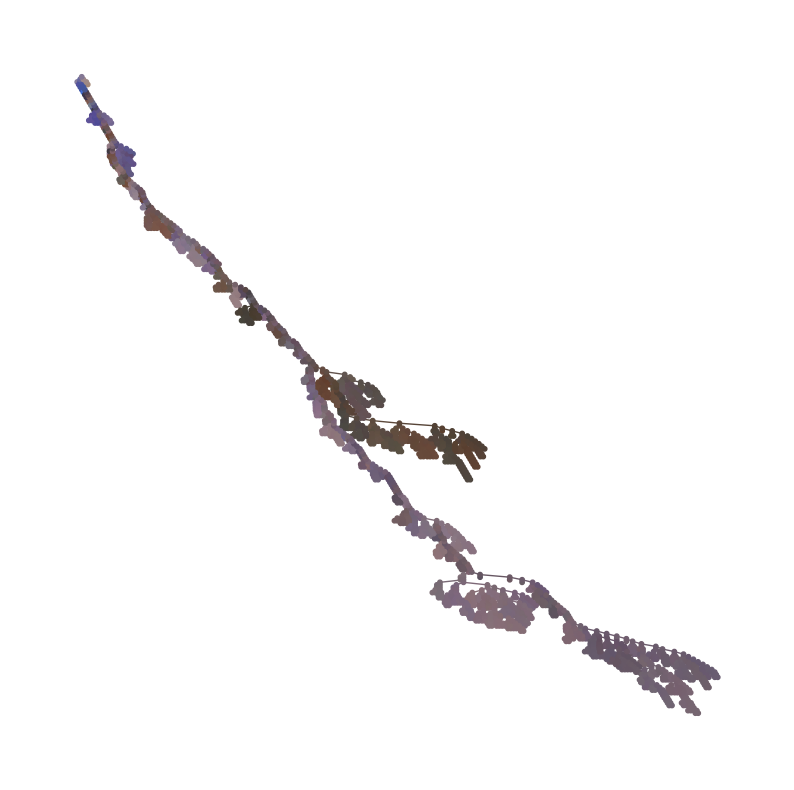

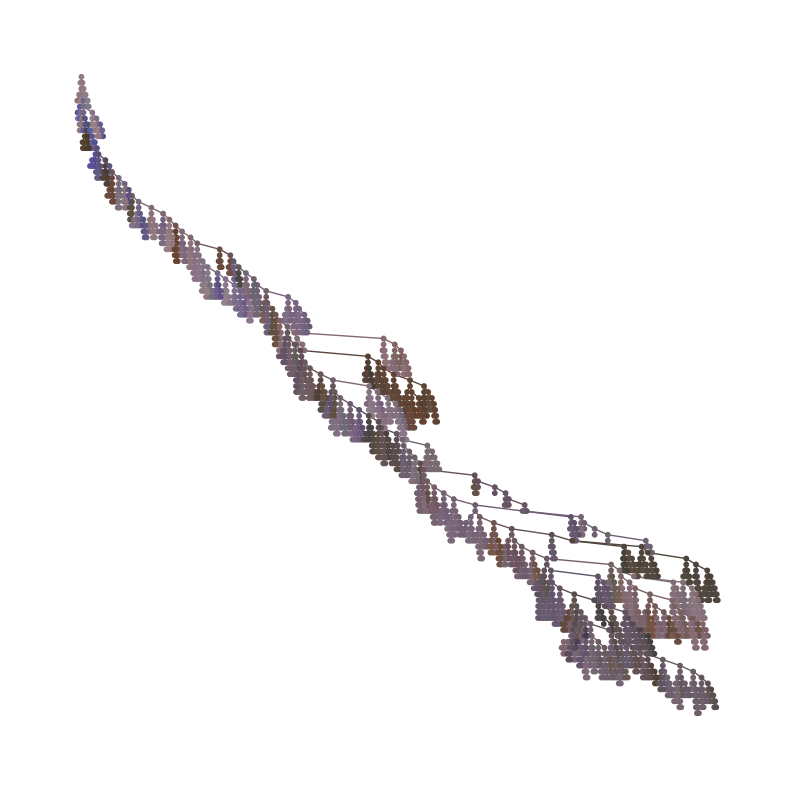

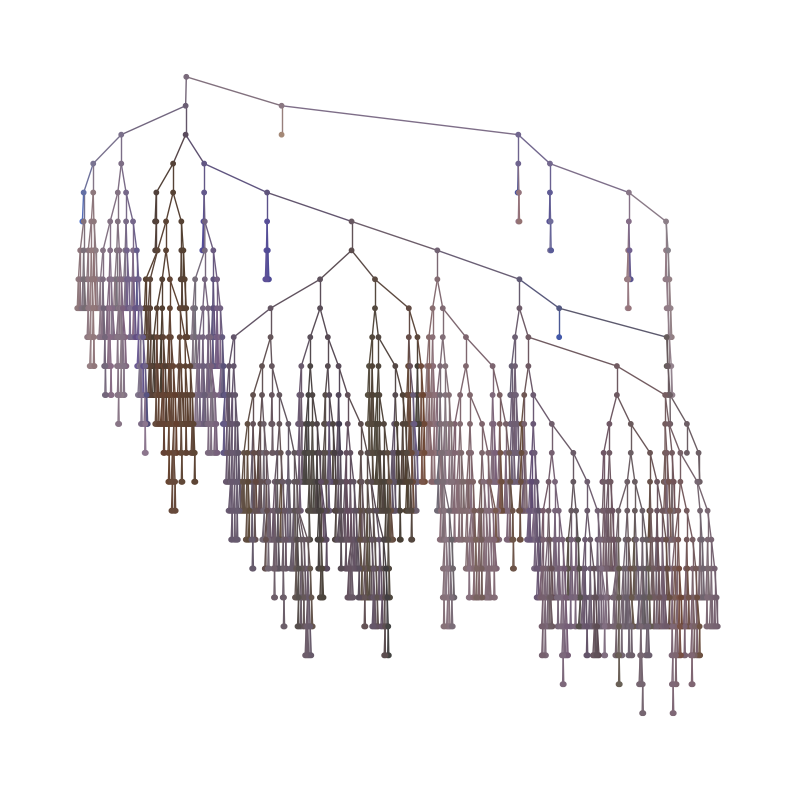

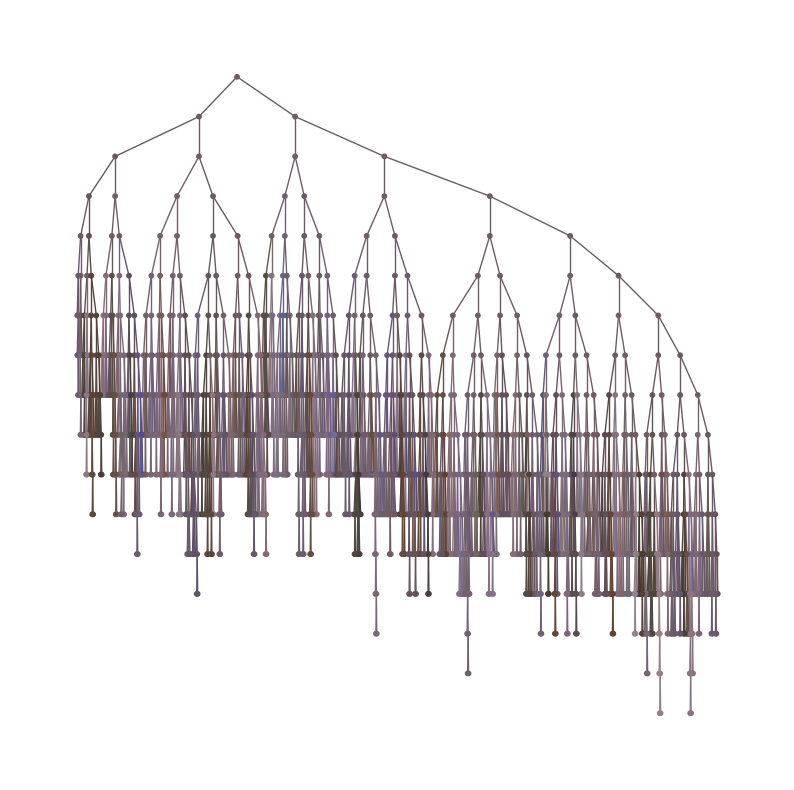

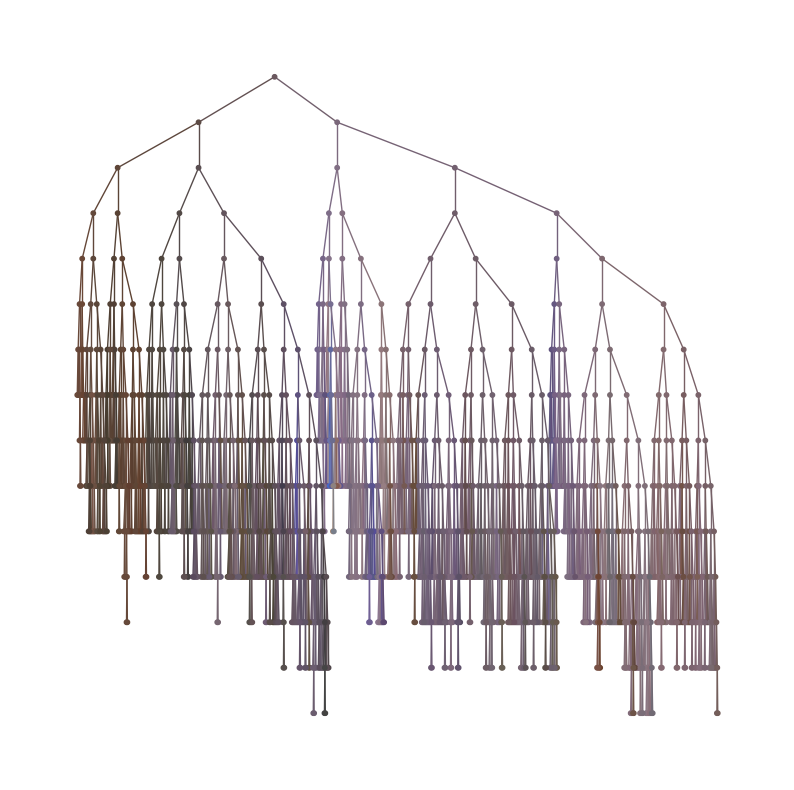

In [16]:
# ax, fig = plt.subplots(1, 5, figsize=(20, 10))

img_name = img_path.split('/')[-1].split('.')[0]

for i, c in enumerate(coefs.items()):
    fig = plt.figure()
    fig.set_size_inches(10, 10)
    ax = fig.add_subplot(111, facecolor='white')
    fig.patch.set_facecolor('white')
    
    coef_name, coef = c
    
    G = gen_color_G(padress[coef_name], weighted=False)
    
    node_colors = [G.nodes[i]['color'] for i in G.nodes]
    edge_colors = [G.edges[e]['color'] for e in G.edges]
    
    pos = nx.drawing.nx_agraph.graphviz_layout(G, prog='dot')
    nx.draw(G, pos, with_labels=False, arrows=False, node_size=10, ax=ax, node_color=node_colors, edge_color=edge_colors)
    
    # save each plot to a file
    plt.savefig(f'./../output/{img_name}_{coef_name}.png')

In [17]:
from spectral import spectral_clustering

much_compressed = cv2.resize(img, (0, 0), fx=0.005, fy=0.005)

print(f'shape: {much_compressed.shape}, size: {much_compressed.shape[0] * much_compressed.shape[1]}')

much_compressed = np.array(much_compressed)

much_compressed = much_compressed/255
print(much_compressed.shape)

centers, labels = spectral_clustering(much_compressed.reshape(-1, 3), 5)

shape: (15, 18, 3), size: 270
(15, 18, 3)


In [18]:
def centers_from_labels(labels, X):
    centers = []
    for i in range(len(np.unique(labels))):
        centers.append(np.mean(X[labels == i], axis=0))
    return np.array(centers)

In [19]:
def plot_dominating(path, k, scale=0.05, reverse=False):
    mon_img = cv2.imread(path)
    mon_compressed = cv2.resize(mon_img, (0, 0), fx=scale, fy=scale)
    mon_compressed = mon_compressed/255

    print(mon_compressed.shape)

    centers, labels = spectral_clustering(mon_compressed.reshape(-1, 3), k, n=1)
    
    impurity = classification_impurity(mon_compressed.reshape(-1, 3), labels)
    print(f'impurity: {impurity}')
    
    centers = centers_from_labels(labels, mon_compressed.reshape(-1, 3))
    if reverse:
        centers = reverse_rgb(centers)
    
    plot_colors(centers)

(15, 18, 3)
impurity: 0.04797240229747905


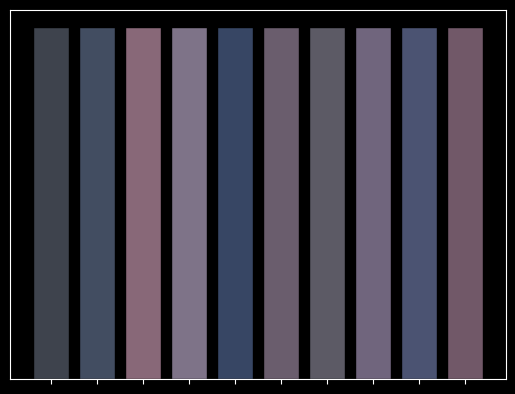

In [20]:
plot_dominating('./../data/london.jpg', 10, scale=0.005, reverse=True)

(18, 18, 3)
impurity: 0.01153316653313377


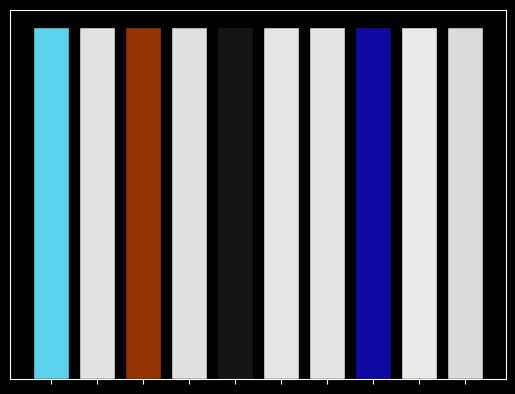

In [21]:
plot_dominating('./../data/mondrian.jpg', 10, scale=0.04)

(22, 25, 3)
impurity: 0.037883505855307954


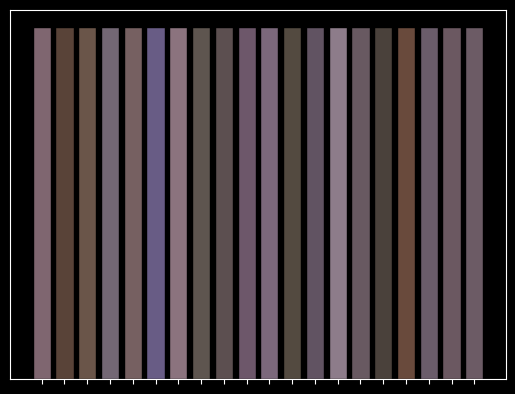

In [22]:
plot_dominating('./../data/london.jpg', 20, scale=0.007)

In [23]:

# add x, y to each tuple
def add_pos(img):
    h, w, _ = img.shape
    res = []
    for i in range(h):
        for j in range(w):
            r, g, b = img[i, j]
            res.append((r, g, b, i, j))
    return np.array(res)

In [24]:

def dist_f_exp(exp):
    def dist_f(X, Y, axis=-1):
        # return the norm but with the exponent
        return np.linalg.norm(X - Y, ord=exp, axis=axis)
    return dist_f
    
def rgbpos_to_cmyk_array(rgb_array):
    cmyk_array = np.zeros((rgb_array.shape[0], 6))
    
    for i, (r, g, b, x, y) in enumerate(rgb_array):
        k = 1 - max(r, g, b)
        
        if k < 1:
            c = (1 - r - k) / (1 - k)
            m = (1 - g - k) / (1 - k)
            y = (1 - b - k) / (1 - k)
        else:
            c = 0
            m = 0
            y = 0
        cmyk_array[i] = [c, m, y, k, x, y]
    return cmyk_array



def plot_dominating_with_pos(path, k, scale=0.01, reverse=False, exp=0.5):
    mon_img = cv2.imread(path)
    mon_compressed = cv2.resize(mon_img, (0, 0), fx=scale, fy=scale)
    mon_compressed = mon_compressed/255

    
    img_with_pos = add_pos(mon_compressed)
    
    img_cmyk = rgbpos_to_cmyk_array(img_with_pos)

    print(img_with_pos.shape)
    

    centers, labels = spectral_clustering(img_cmyk, k, n=1, dist_f=dist_f_exp(exp))
    
    impurity = classification_impurity(img_cmyk, labels)
    print(f'impurity: {impurity}')
    
    centers = centers_from_labels(labels, img_with_pos.reshape(-1, 5))
    centers = centers[:, :3]
    if reverse:
        centers = reverse_rgb(centers)
    
    plot_colors(centers[:, :3])

(672, 5)
impurity: 0.4811556749982921


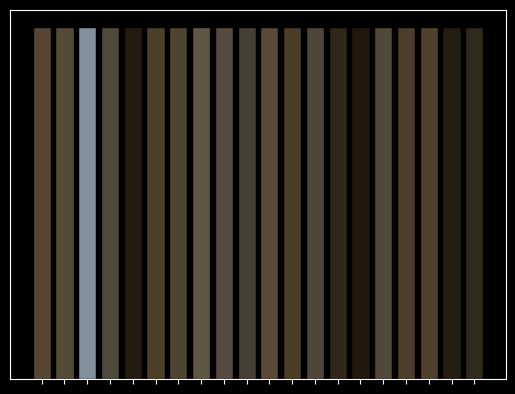

In [25]:
plot_dominating_with_pos('./../data/girl_with_earring.jpg', 20, scale=0.03, reverse=True, exp=2)

In [26]:

def plot_dominating_hier(img_path, k, scale=0.01, reverse=False, exp=0.5, coef=merging_single_coefs):
    img = cv2.imread(img_path)
    img_compressed = cv2.resize(img, (0, 0), fx=scale, fy=scale)
    
    img_compressed = img_compressed / 255.0
    
    print(img_compressed.shape)
    
    labels, padre = hierarchical_lance_williams(img_compressed.reshape(-1, 3), k, merging_coefs=coef)
    
    centers = centers_from_labels(labels, img_compressed.reshape(-1, 3))
    
    impurity = classification_impurity(img_compressed.reshape(-1, 3), labels)
    print(f'impurity: {impurity}')
    
    if reverse:
        centers = reverse_rgb(centers)
    
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    
    # Display original image
    axs[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axs[0].axis('off')
    axs[0].set_title('Original Image')
    
    # Prepare the data for the bar plot
    num_colors = len(centers)
    bar_positions = np.arange(num_colors)
    bar_heights = np.ones(num_colors)
    
    # Plot colors as vertical bars
    for i, color in enumerate(centers):
        axs[1].bar(bar_positions[i], bar_heights[i], color=color, edgecolor='none', width=1)
    
    axs[1].set_xlim(-0.5, num_colors - 0.5)
    axs[1].set_ylim(0, 1)
    axs[1].axis('off')
    axs[1].set_title('Dominating Colors')
    
    plt.tight_layout()
    plt.show()

(15, 18, 3)
impurity: 0.03586708907143121


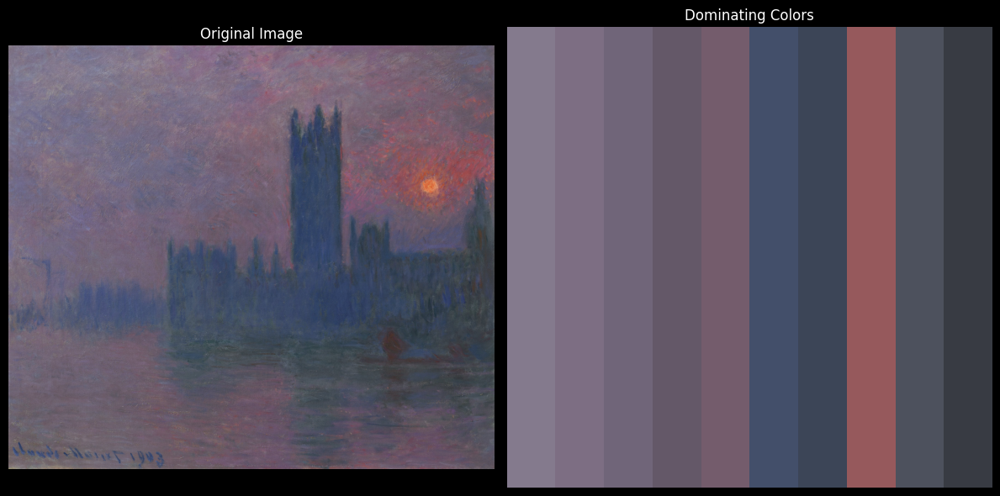

In [27]:
plot_dominating_hier('./../data/london.jpg', 10, scale=0.005, reverse=True, coef=merging_ward_coefs)

(29, 19, 3)
impurity: 0.2259698817055946


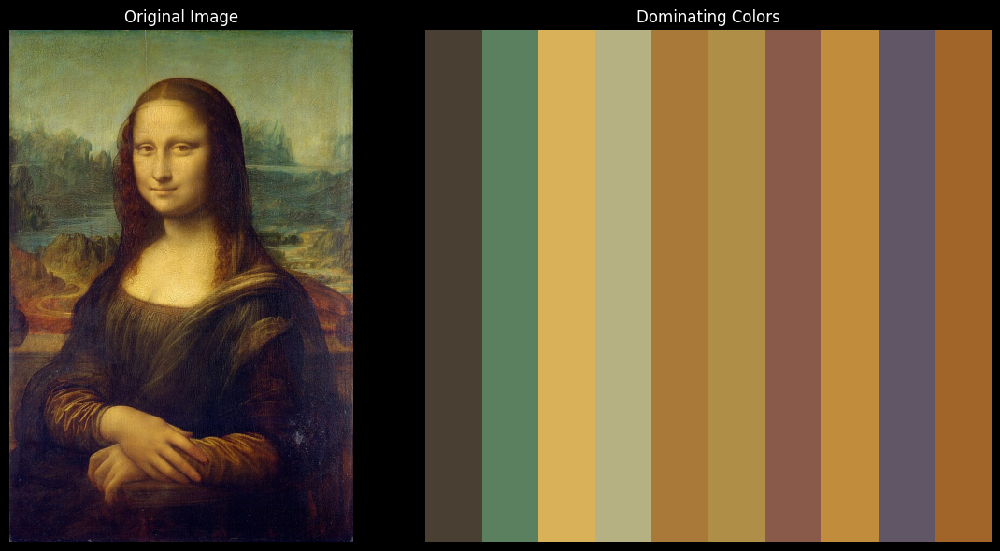

In [28]:
plot_dominating_hier('./../data/mona_lisa.jpg', 10, scale=0.03, reverse=True)

(18, 18, 3)
impurity: 0.017828127857917618


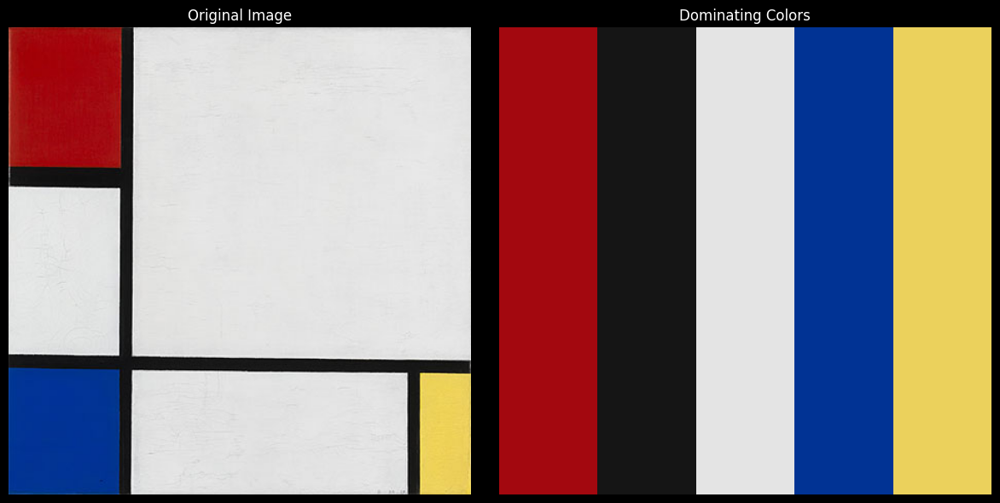

In [29]:
plot_dominating_hier('./../data/mondrian.jpg', 5, scale=0.04, reverse=True)

(19, 16, 3)
impurity: 0.19882852487160751


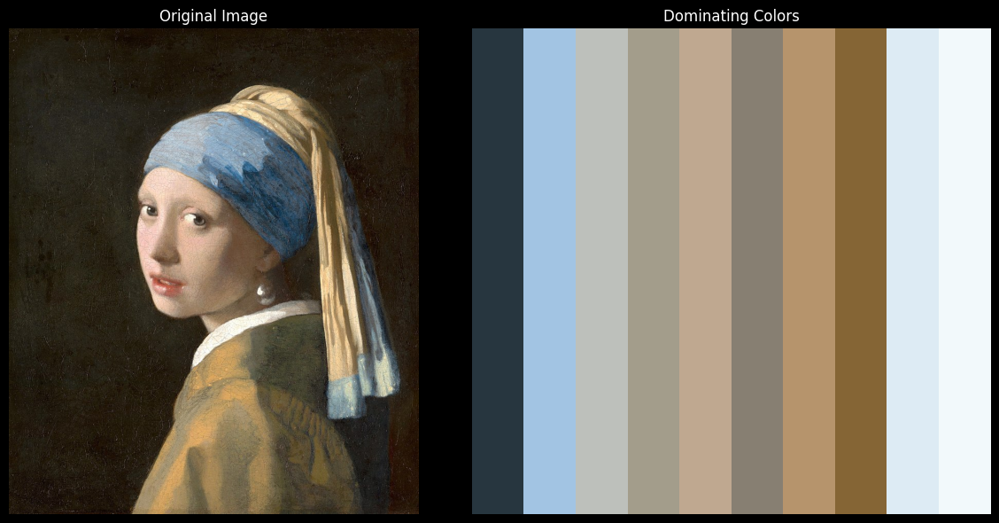

In [40]:
plot_dominating_hier('./../data/girl_with_earring.jpg', 10, scale=0.02, reverse=False)

(13, 16, 3)
impurity: 0.057906201525506074


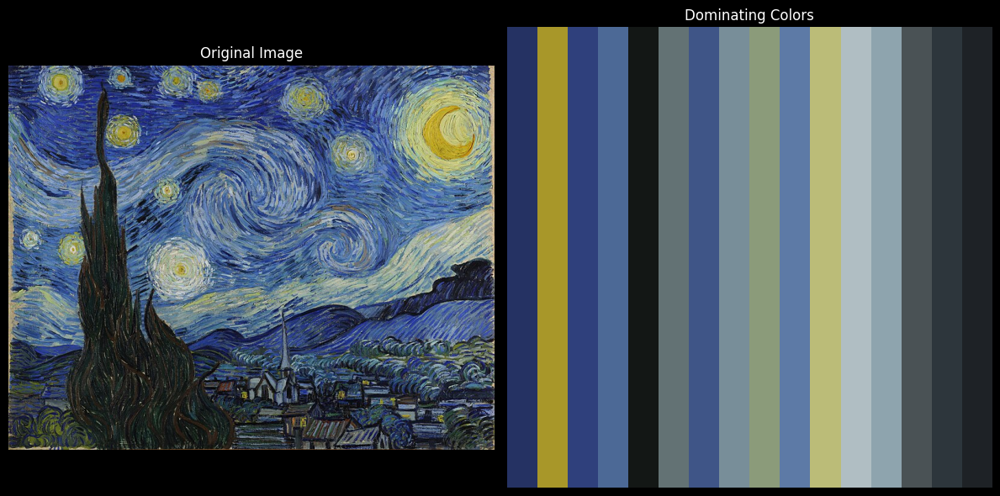

In [31]:
plot_dominating_hier('./../data/starry_night.jpg', 16, scale=0.02, reverse=True, coef=merging_ward_coefs)

(18, 27, 3)
impurity: 0.04277794973431783


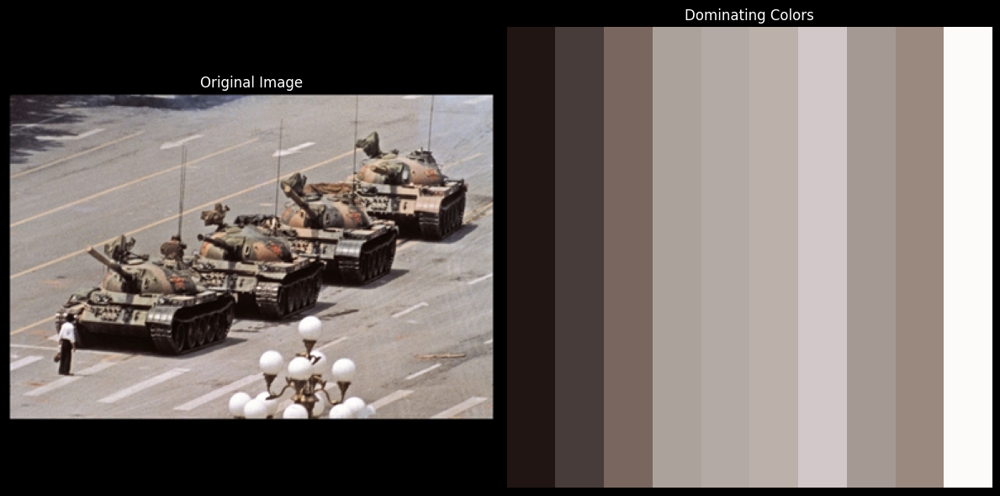

In [46]:
plot_dominating_hier('./../data/tank_man.jpg', 10, scale=0.07, reverse=True, coef=merging_ward_coefs)

(12, 8, 3)
impurity: 0.05063513731247726


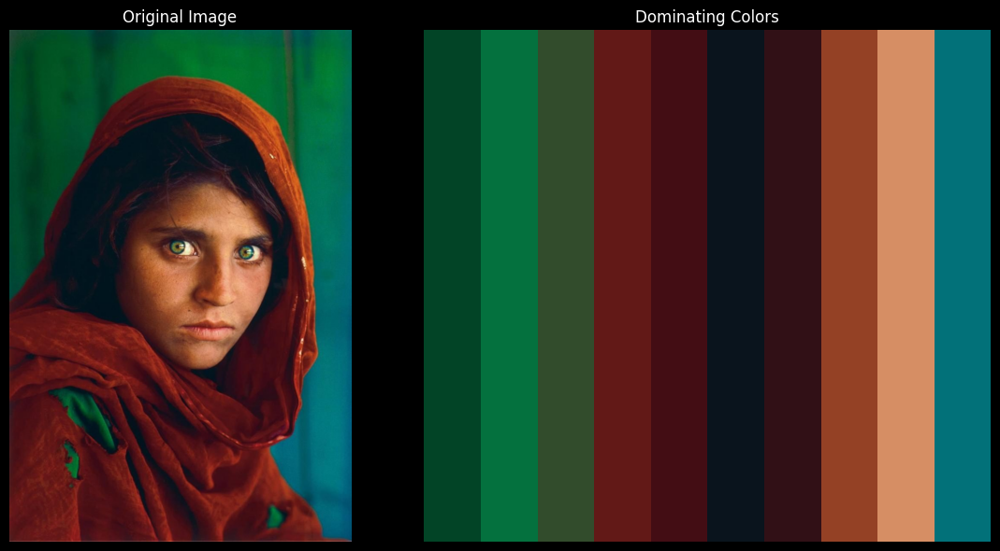

In [52]:
plot_dominating_hier('./../data/afghan_gir.jpg', 10, scale=0.01, reverse=True, coef=merging_ward_coefs)

(21, 29, 3)
impurity: 0.036071048400197654


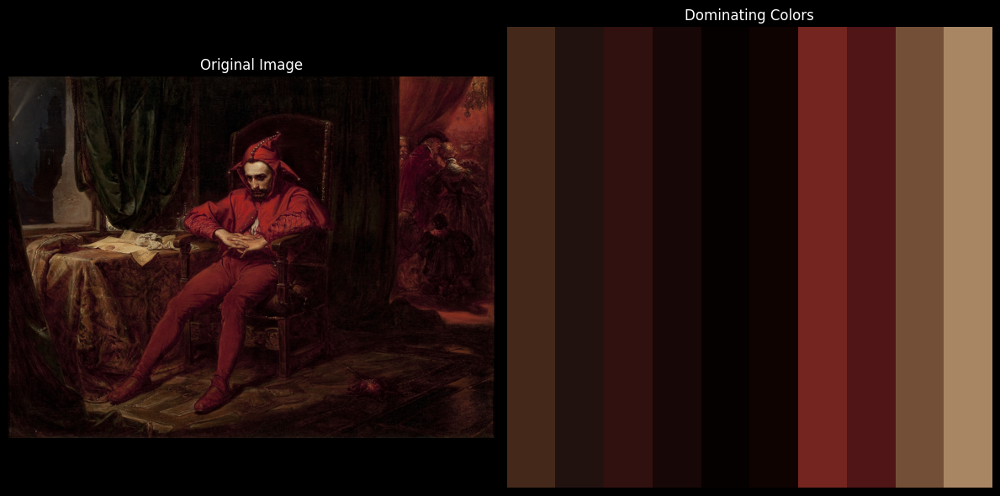

In [56]:
plot_dominating_hier('./../data/stanczyk.jpg', 10, scale=0.005, reverse=True, coef=merging_ward_coefs)